In [1]:
#import
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OrdinalEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, classification_report, confusion_matrix
)

from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

try:
    from xgboost import XGBClassifier
    HAVE_XGB = True
except Exception:
    HAVE_XGB = False

RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)

CSV_PATH = "secondary_data.csv"  
SEP = ";"                       

all_results = []


In [27]:
# load train and test data
data = np.load("mushroom_train_test.npz", allow_pickle=True)
X_train = data["X_train"]
X_test  = data["X_test"]
y_train = data["y_train"]
y_test  = data["y_test"]
feat_names = data["feat_names"].tolist()

print(f"Loaded shapes: X_train={X_train.shape}, X_test={X_test.shape}")


Loaded shapes: X_train=(48855, 16), X_test=(12214, 16)


Baseline RF trained successfully.
Train ROC AUC: 1.0000
Test  ROC AUC: 1.0000
Train shape: (48855, 16), Test shape: (12214, 16)

Top Permutation Importances:


,feature,mean,std
15,num_stem-width,0.026639,0.000921
4,cat_gill-attachment,0.018153,0.000697
5,cat_gill-spacing,0.009356,0.000348
7,cat_stem-surface,0.009310,0.000338
8,cat_stem-color,0.008546,0.000398
1,cat_cap-surface,0.002575,0.000131
0,cat_cap-shape,0.002232,0.000192
13,num_cap-diameter,0.000888,0.000106
3,cat_does-bruise-or-bleed,0.000807,0.000060
6,cat_gill-color,0.000641,0.000075


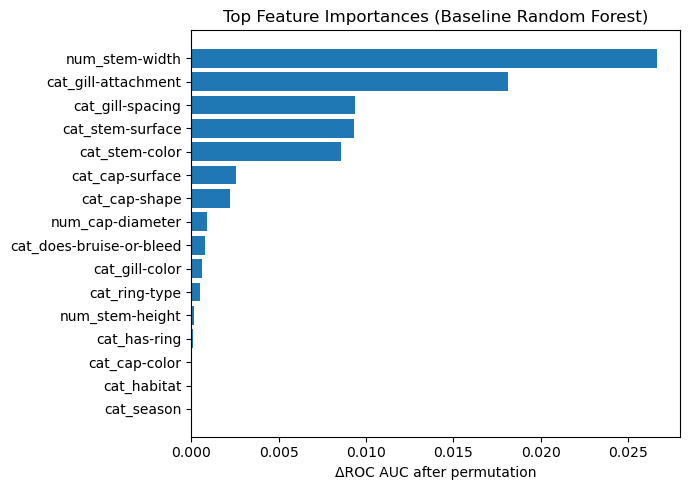


Generating SHAP summary plot...


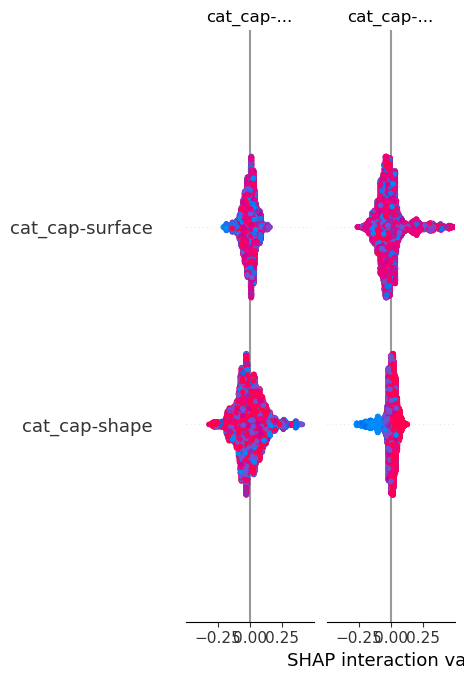


Generating SHAP bar plot...


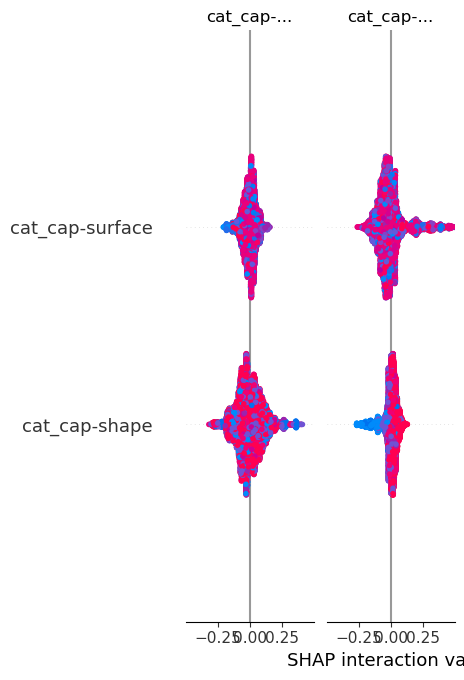

In [6]:
# ============================================
# BASELINE RANDOM FOREST INTERPRETABILITY
# ============================================

from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
from sklearn.metrics import roc_auc_score
import shap, pandas as pd, numpy as np, matplotlib.pyplot as plt

# -------------------------------
# 1. Fit your baseline RandomForest
# -------------------------------
rf_baseline = RandomForestClassifier(
    n_estimators=200,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf_baseline.fit(X_train, y_train)

print("Baseline RF trained successfully.")
print(f"Train ROC AUC: {roc_auc_score(y_train, rf_baseline.predict_proba(X_train)[:,1]):.4f}")
print(f"Test  ROC AUC: {roc_auc_score(y_test, rf_baseline.predict_proba(X_test)[:,1]):.4f}")
print(f"Train shape: {X_train.shape}, Test shape: {X_test.shape}")

# -------------------------------
# 2. Permutation Importance
# -------------------------------
perm = permutation_importance(
    rf_baseline, X_test, y_test,
    n_repeats=10, random_state=42, scoring="roc_auc"
)

perm_df = pd.DataFrame({
    "feature": feat_names,
    "mean": perm.importances_mean,
    "std": perm.importances_std
}).sort_values("mean", ascending=False)

print("\nTop Permutation Importances:")
display(perm_df.head(15))

# --- plot top 20 ---
top = perm_df.head(20).iloc[::-1]
plt.figure(figsize=(7,5))
plt.barh(top["feature"], top["mean"])
plt.xlabel("ΔROC AUC after permutation")
plt.title("Top Feature Importances (Baseline Random Forest)")
plt.tight_layout()
plt.show()



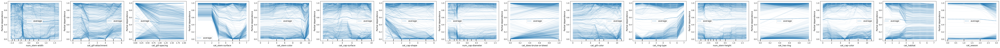

In [25]:
# --- B3) PDP / ICE for top-3 features (baseline RF on preprocessed X) ---
from sklearn.inspection import PartialDependenceDisplay

# Use the same representation the model was trained on (X_test) but add column names for nicer plots
X_test_pd = pd.DataFrame(X_test, columns=feat_names)

# pick top-3 features from permutation importance (already computed on baseline RF)
top3 = perm_df["feature"].head(16).tolist()

fig, ax = plt.subplots(1, len(top3), figsize=(5*len(top3), 4))
if len(top3) == 1:
    ax = [ax]

for i, f in enumerate(top3):
    # f is a feature NAME present in X_test_pd.columns
    PartialDependenceDisplay.from_estimator(
        rf_baseline,                # baseline RandomForest trained on X_train
        X_test_pd,                  # same feature space (+ names)
        [f],                        # refer to feature by name
        kind="both",
        ax=ax[i],
        ice_lines_kw={"alpha": 0.15}
    )

plt.tight_layout()
plt.show()


SANITY

In [9]:
import numpy as np, pandas as pd
from collections import Counter

print("—"*60, "\n[1] DATASET & SPLIT SANITY")

# 1.a Label domain & prevalence
def summarize_labels(name, y):
    cnt = Counter(y)
    n = len(y)
    prev = {k: f"{v} ({v/n:0.2%})" for k,v in cnt.items()}
    print(f"{name}: n={n}, distribution={prev}")

# labels must be in {0,1}
assert set(np.unique(y_train)).issubset({0,1}) and set(np.unique(y_test)).issubset({0,1}), \
    "Labels should be binary {0,1}"

summarize_labels("Train", y_train)
summarize_labels("Test ", y_test)

# 1.b Train/Test prevalence similarity (absolute diff should be small)
p_train = np.mean(y_train)
p_test  = np.mean(y_test)
print(f"Prevalence train={p_train:0.4f}, test={p_test:0.4f}, |Δ|={abs(p_train-p_test):0.4f}")

# 1.c Duplicates check (full-row duplicates). We report both w/ and w/o label.
train_dups_all = X_train_df.duplicated(keep=False).sum()
test_dups_all  = X_test_df.duplicated(keep=False).sum()
print(f"Potential duplicate rows → train: {train_dups_all}, test: {test_dups_all}")

train_dups_no_y = pd.concat([X_train_df, y_train.rename("class")], axis=1).duplicated(subset=X_train_df.columns, keep=False).sum()
test_dups_no_y  = pd.concat([X_test_df, y_test.rename("class")], axis=1).duplicated(subset=X_test_df.columns, keep=False).sum()
print(f"Potential feature-only duplicates → train: {train_dups_no_y}, test: {test_dups_no_y}")

# 1.d Constant / near-constant columns (can cause instability)
def constant_cols(df, thresh=1):  # thresh=1 → truly constant; raise to e.g. 2 for almost-constant
    return [c for c in df.columns if df[c].nunique(dropna=False) <= thresh]
const_train = constant_cols(X_train_df, 1)
if const_train:
    print(f"Constant columns in train ({len(const_train)}): {const_train[:10]}{' ...' if len(const_train)>10 else ''}")
else:
    print("No constant columns detected in train.")

# 1.e High-cardinality categoricals (watch for IDs/leakage-like proxies)
high_card = [c for c in cat_cols if X_train_df[c].nunique() > 0.9*len(X_train_df)]
if high_card:
    print(f"High-cardinality categorical(s) ({len(high_card)}) → possible IDs: {high_card[:10]}{' ...' if len(high_card)>10 else ''}")
else:
    print("No obvious high-cardinality categorical ID-columns.")


———————————————————————————————————————————————————————————— 
[1] DATASET & SPLIT SANITY
Train: n=48855, distribution={0: '21745 (44.51%)', 1: '27110 (55.49%)'}
Test : n=12214, distribution={0: '5436 (44.51%)', 1: '6778 (55.49%)'}
Prevalence train=0.5549, test=0.5549, |Δ|=0.0000
Potential duplicate rows → train: 178, test: 6
Potential feature-only duplicates → train: 178, test: 6
No constant columns detected in train.
No obvious high-cardinality categorical ID-columns.


In [13]:
import numpy as np

print("—"*60, "\n[2] PREPROCESSING SANITY")

# 2.a No NaNs after your preprocessing (you already imputed & encoded -> X_train/X_test)
assert not np.isnan(X_train).any(), "NaNs found in X_train after preprocessing!"
assert not np.isnan(X_test).any(),  "NaNs found in X_test after preprocessing!"
print("No NaNs in preprocessed matrices ✅")

# 2.b Feature alignment: same #features in train/test and matches the fitted RF
assert X_train.shape[1] == X_test.shape[1], "Train/Test feature counts differ!"
assert rf_baseline.n_features_in_ == X_train.shape[1], (
    f"RF expects {rf_baseline.n_features_in_} features but X_train has {X_train.shape[1]}."
)
print("Feature dimensions aligned with model ✅")

# 2.c Determinism (same predictions twice without refit)
p1 = rf_baseline.predict(X_test)
p2 = rf_baseline.predict(X_test)
assert np.array_equal(p1, p2), "Non-deterministic predictions from same fitted RF"
print("Deterministic predictions from RF ✅")

# 2.d Probabilities are valid (in-range and sum to 1 for binary)
proba = rf_baseline.predict_proba(X_test)
assert np.all((proba >= 0) & (proba <= 1)), "Probabilities out of [0,1] range"
assert np.allclose(proba.sum(axis=1), 1.0, atol=1e-6), "Row probabilities don't sum to 1"
print("Probability outputs are well-formed ✅")

# 2.e Label sanity (binary 0/1, no NaNs)
assert set(np.unique(y_train)).issubset({0, 1}) and set(np.unique(y_test)).issubset({0, 1}), \
    "Unexpected labels detected (expected 0/1)."
print("Labels look correct (binary, no NaNs) ✅")



———————————————————————————————————————————————————————————— 
[2] PREPROCESSING SANITY
No NaNs in preprocessed matrices ✅
Feature dimensions aligned with model ✅
Deterministic predictions from RF ✅
Probability outputs are well-formed ✅
Labels look correct (binary, no NaNs) ✅


In [18]:
from sklearn.dummy import DummyClassifier
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
import numpy as np

print("—"*60, "\n[3] BASELINES & OVERFIT CHECKS")

# 3.a Dummy baselines on the SAME representation your RF sees (preprocessed X)
dummy_mf = DummyClassifier(strategy="most_frequent", random_state=42)
dummy_st = DummyClassifier(strategy="stratified",    random_state=42)

def fit_eval_dummy(dum, name):
    dum.fit(X_train, y_train)                     # X_train is already preprocessed
    yp   = dum.predict(X_test)
    # AUC handling (use proba if available; else fall back to NaN)
    auc = np.nan
    if hasattr(dum, "predict_proba"):
        ypro = dum.predict_proba(X_test)[:, 1]
        auc  = roc_auc_score(y_test, ypro)
    print(f"{name:>12} → Acc={accuracy_score(y_test, yp):.4f} | "
          f"F1={f1_score(y_test, yp):.4f} | ROC_AUC={auc:.4f}")

fit_eval_dummy(dummy_mf, "Dummy most_f")
fit_eval_dummy(dummy_st, "Dummy strat")

# 3.b Train vs Test performance for your baseline RF (large gaps → overfit risk)
y_pred_tr = rf_baseline.predict(X_train)
y_pred_te = rf_baseline.predict(X_test)

# Prefer probabilities for AUC
y_pro_tr  = rf_baseline.predict_proba(X_train)[:, 1]
y_pro_te  = rf_baseline.predict_proba(X_test)[:, 1]

def quick_metrics(y, yp, ypro):
    return dict(
        acc=accuracy_score(y, yp),
        f1=f1_score(y, yp),
        auc=roc_auc_score(y, ypro)
    )

m_tr = quick_metrics(y_train, y_pred_tr, y_pro_tr)
m_te = quick_metrics(y_test,  y_pred_te, y_pro_te)
gap  = {k: m_tr[k] - m_te[k] for k in m_tr}

print(f"Train metrics: {m_tr}")
print(f" Test metrics: {m_te}")
print(f"      Gaps Δ : {gap}  (large positive gaps suggest overfit)")


———————————————————————————————————————————————————————————— 
[3] BASELINES & OVERFIT CHECKS
Dummy most_f → Acc=0.5549 | F1=0.7138 | ROC_AUC=0.5000
 Dummy strat → Acc=0.5148 | F1=0.5655 | ROC_AUC=0.5081
Train metrics: {'acc': 1.0, 'f1': 1.0, 'auc': 1.0}
 Test metrics: {'acc': 0.9999181267398067, 'f1': 0.999926226484692, 'auc': 0.9999999457188571}
      Gaps Δ : {'acc': 8.18732601932659e-05, 'f1': 7.377351530801768e-05, 'auc': 5.428114291383679e-08}  (large positive gaps suggest overfit)


In [19]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score
import numpy as np

print("—"*60, "\n[4] PERMUTED-LABEL TEST (SHOULD ≈ CHANCE)")

rng = np.random.RandomState(7)
aucs = []

# run a few repeats to confirm that label shuffling destroys signal
for i in range(3):
    # shuffle training labels (breaks feature–label relationship)
    y_perm = rng.permutation(y_train)

    # train a fresh RF on the shuffled labels
    perm_rf = RandomForestClassifier(
        n_estimators=200,
        max_features="sqrt",
        random_state=42 + i,
        n_jobs=-1
    )
    perm_rf.fit(X_train, y_perm)

    # predict on the original (unshuffled) test set
    prob = perm_rf.predict_proba(X_test)[:, 1]
    auc = roc_auc_score(y_test, prob)
    aucs.append(auc)

# print results
print(f"AUCs with permuted labels: {['%0.3f' % a for a in aucs]}  → expected ~0.5; "
      f"mean={np.mean(aucs):0.3f}")


———————————————————————————————————————————————————————————— 
[4] PERMUTED-LABEL TEST (SHOULD ≈ CHANCE)
AUCs with permuted labels: ['0.507', '0.499', '0.491']  → expected ~0.5; mean=0.499


In [20]:
from sklearn.metrics import precision_recall_curve, auc
import numpy as np

print("—"*60, "\n[5] METRIC SANITY")

# AUPRC (area under precision–recall curve) should be ≥ positive-class prevalence for a useful model
pos_prev = np.mean(y_test)

# predicted probabilities from your trained RF
y_prob = rf_baseline.predict_proba(X_test)[:, 1]

# compute PR curve and AUPRC
prec, rec, _ = precision_recall_curve(y_test, y_prob)
auprc = auc(rec, prec)

print(f"Positive prevalence = {pos_prev:.4f}")
print(f"AUPRC = {auprc:.4f} → {'OK ✅' if auprc >= pos_prev else 'LOW ⚠️ (below prevalence!)'}")


———————————————————————————————————————————————————————————— 
[5] METRIC SANITY
Positive prevalence = 0.5549
AUPRC = 1.0000 → OK ✅


In [21]:
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestClassifier
import numpy as np

print("—"*60, "\n[6] FEATURE-ORDER INVARIANCE (array-level)")

# Baseline AUC from your already-fitted RF on the original (unshuffled) feature order
auc_base = roc_auc_score(y_test, rf_baseline.predict_proba(X_test)[:, 1])

# Create a random permutation of feature indices
rng = np.random.RandomState(123)
perm_idx = rng.permutation(X_train.shape[1])

# Apply the SAME permutation to train and test matrices (keeps features aligned)
X_train_shuf = X_train[:, perm_idx]
X_test_shuf  = X_test[:,  perm_idx]

# Fit an equivalent RF on the shuffled feature order
rf_shuf = RandomForestClassifier(
    n_estimators=200,
    max_features="sqrt",
    random_state=99,
    n_jobs=-1
)
rf_shuf.fit(X_train_shuf, y_train)

# AUC with shuffled column order
auc_shuf = roc_auc_score(y_test, rf_shuf.predict_proba(X_test_shuf)[:, 1])

print(f"AUC(base)={auc_base:0.4f} vs AUC(shuffled-cols)={auc_shuf:0.4f}")
# For tree models, performance should be effectively identical when train/test are shuffled identically.


———————————————————————————————————————————————————————————— 
[6] FEATURE-ORDER INVARIANCE (array-level)
AUC(base)=1.0000 vs AUC(shuffled-cols)=1.0000
